In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys
sys.path.append(os.path.expanduser('~/rds/rds-dsk-lab-eWkDxBhxBrQ/dimorl/code/mopo'))

In [3]:
from collections import namedtuple

import numpy as np
import matplotlib.pyplot as plt

from dogo.results import get_sac_pools, get_experiment_details, PoolArrs
from dogo.rollouts.split import split_halfcheetah_v2_trans_arr
from dogo.visualisation.model_pool_plotting import (
    model_pool_visitation_2dhist,
    model_pool_unpen_rewards_2dhist,
    model_pool_pen_rewards_2dhist,
    model_pool_penalties_2dhist,
    model_pool_rmse_2dhist
)

In [4]:
cols = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

In [5]:
EXP_LIST = [
    # No REx - MOPO Pen 1 - Rollout Length 10 - 1 Retrain Epoch
    'MP874',
    'MP875',
    'MP876',
    # REx - MOPO Pen 1 - Rollout Length 10 - 1 Retrain Epoch
    'MP877',
    'MP878',
    'MP879',
    # No REx - MOPO Pen 1 - Rollout Length 10 - Original Model
    'MP880',
    'MP881',
    'MP882',
    # REx - MOPO Pen 1 - Rollout Length 10 - Original Model
    'MP883',
    'MP884',
    'MP885',
]
training_results = {}
for exp in EXP_LIST:
    # print(exp)
    pool, pca_1d_sa, pca_2d_sa, mse_results, explained_var_2d = get_sac_pools(exp, subsample_size=10000)
    training_results[exp] = PoolArrs(pool, pca_1d_sa, pca_2d_sa, mse_results, explained_var_2d)

# Reward Histograms

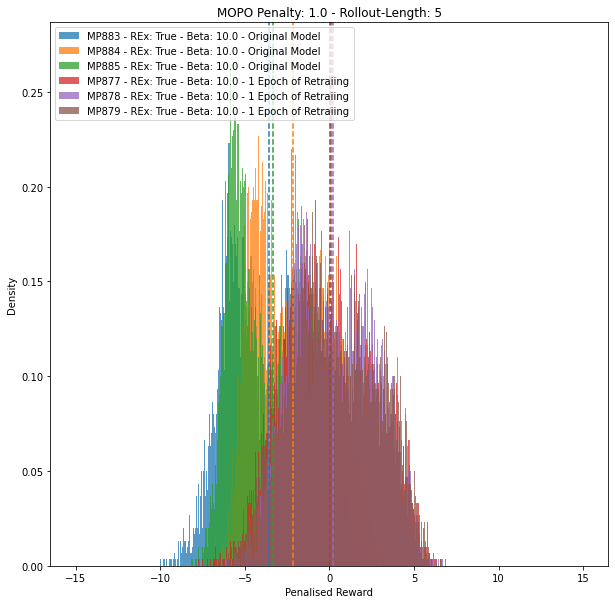

In [6]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
for i, (exp, rex, beta) in enumerate([
    ("MP883", True, "10.0 - Original Model"),
    ("MP884", True, "10.0 - Original Model"),
    ("MP885", True, "10.0 - Original Model"),
    ("MP877", True, "10.0 - 1 Epoch of Retraiing"),
    ("MP878", True, "10.0 - 1 Epoch of Retraiing"),
    ("MP879", True, "10.0 - 1 Epoch of Retraiing"),
]):
    _, _, _, rew, _, _, _ = split_halfcheetah_v2_trans_arr(training_results[exp].pool)
    ax.hist(rew, bins=np.linspace(-15,15,1000), density=True, color=cols[i], alpha=0.75, label=f'{exp} - REx: {rex} - Beta: {beta}')
    ax.axvline(rew.mean(), color=cols[i], ls='--')
ax.set_title('MOPO Penalty: 1.0 - Rollout-Length: 5')
ax.set_xlabel('Penalised Reward')
ax.set_ylabel('Density')
ax.legend(loc='upper left')

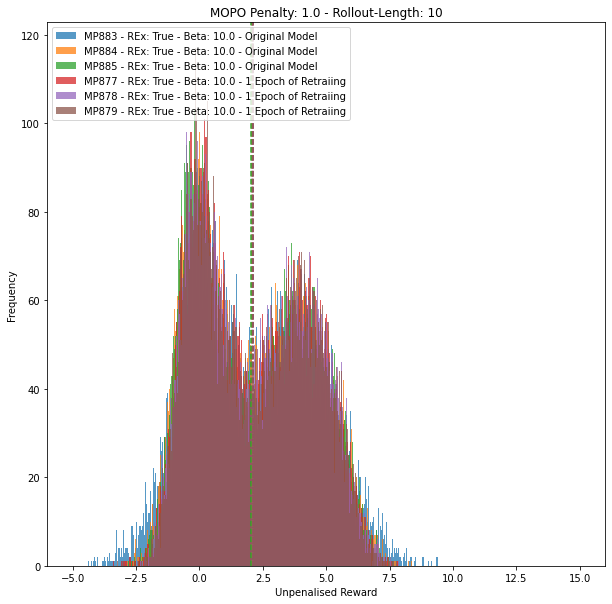

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
for i, (exp, rex, beta) in enumerate([
    ("MP883", True, "10.0 - Original Model"),
    ("MP884", True, "10.0 - Original Model"),
    ("MP885", True, "10.0 - Original Model"),
    ("MP877", True, "10.0 - 1 Epoch of Retraiing"),
    ("MP878", True, "10.0 - 1 Epoch of Retraiing"),
    ("MP879", True, "10.0 - 1 Epoch of Retraiing"),
]):
    _, _, _, rew, _, _, pen = split_halfcheetah_v2_trans_arr(training_results[exp].pool)
    ax.hist(rew+1*pen, bins=np.linspace(-5,15,500), color=cols[i], alpha=0.75, label=f'{exp} - REx: {rex} - Beta: {beta}')
    ax.axvline((rew+1*pen).mean(), color=cols[i], ls='--')
ax.set_title('MOPO Penalty: 1.0 - Rollout-Length: 10')
ax.set_xlabel('Unpenalised Reward')
ax.set_ylabel('Frequency')
ax.legend(loc='upper left')

# Penalty Histograms

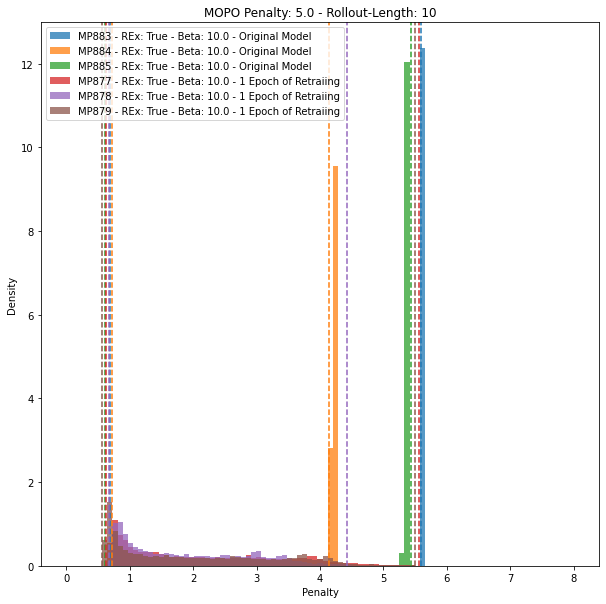

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
for i, (exp, rex, beta) in enumerate([
    ("MP883", True, "10.0 - Original Model"),
    ("MP884", True, "10.0 - Original Model"),
    ("MP885", True, "10.0 - Original Model"),
    ("MP877", True, "10.0 - 1 Epoch of Retraiing"),
    ("MP878", True, "10.0 - 1 Epoch of Retraiing"),
    ("MP879", True, "10.0 - 1 Epoch of Retraiing"),
]):
    exp_details = get_experiment_details(exp)
    _, _, _, _, _, _, pens = split_halfcheetah_v2_trans_arr(training_results[exp].pool)
    ax.hist(pens, bins=np.linspace(0,8,100), density=True, color=cols[i], alpha=0.75, label=f'{exp} - REx: {rex} - Beta: {beta}')
    ax.axvline(exp_details.min_penalty, color=cols[i], ls='--')
    ax.axvline(exp_details.max_penalty, color=cols[i], ls='--')
ax.set_title('MOPO Penalty: 5.0 - Rollout-Length: 10')
ax.set_xlabel('Penalty')
ax.set_ylabel('Density')
ax.legend(loc='upper left')

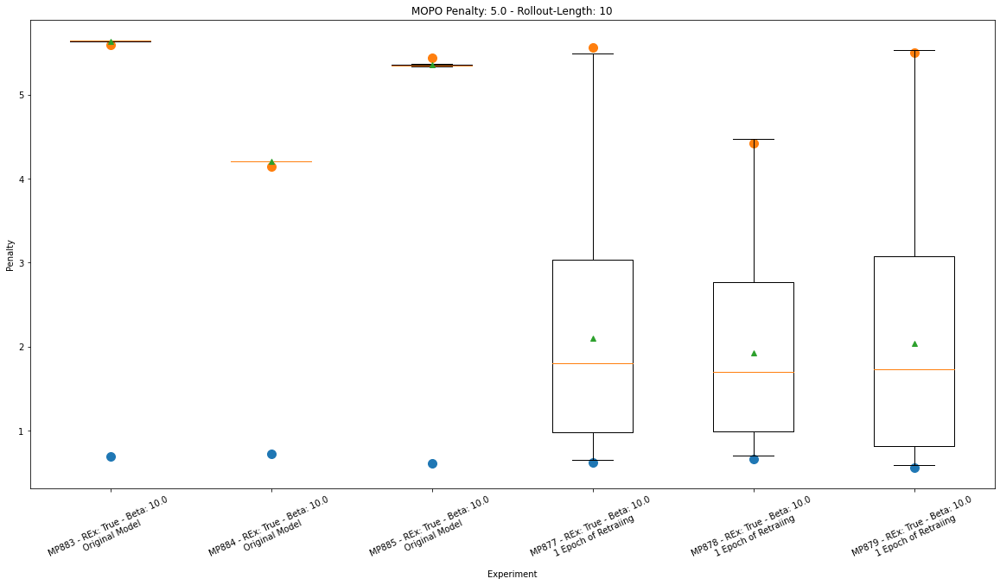

In [13]:
fig, ax = plt.subplots(1, 1, figsize=(20,10))

labels = []
pens_arrs = []
min_pens = []
max_pens = []
for i, (exp, rex, beta) in enumerate([
    ("MP883", True, "10.0\nOriginal Model"),
    ("MP884", True, "10.0\nOriginal Model"),
    ("MP885", True, "10.0\nOriginal Model"),
    ("MP877", True, "10.0\n1 Epoch of Retraiing"),
    ("MP878", True, "10.0\n1 Epoch of Retraiing"),
    ("MP879", True, "10.0\n1 Epoch of Retraiing"),
]):
    exp_details = get_experiment_details(exp)
    _, _, _, _, _, _, pens = split_halfcheetah_v2_trans_arr(training_results[exp].pool)
    pens_arrs.append(pens.flatten())
    
    labels.append(f'{exp} - REx: {rex} - Beta: {beta}')
    min_pens.append(exp_details.min_penalty)
    max_pens.append(exp_details.max_penalty)

x_vals = np.arange(len(pens_arrs))+1
ax.boxplot(pens_arrs, showmeans=True, showfliers=False)
ax.scatter(x_vals, min_pens, s=100)
ax.scatter(x_vals, max_pens, s=100)

ax.set_title('MOPO Penalty: 5.0 - Rollout-Length: 10')
ax.set_xlabel('Experiment')
ax.set_ylabel('Penalty')
ax.set_xticks(x_vals)
ax.set_xticklabels(labels, rotation=25)
pass

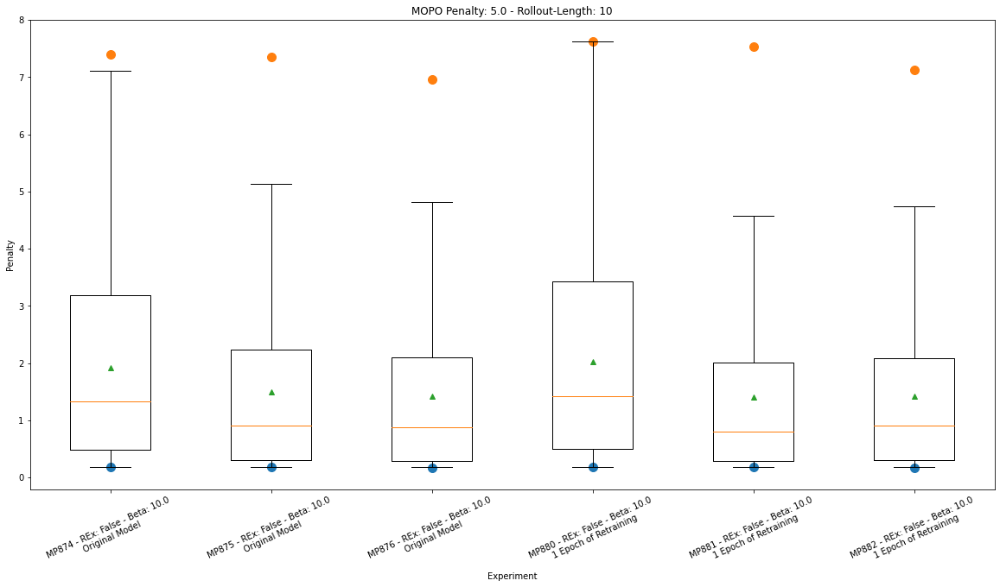

In [11]:
fig, ax = plt.subplots(1, 1, figsize=(20,10))

labels = []
pens_arrs = []
min_pens = []
max_pens = []
for i, (exp, rex, beta) in enumerate([
    ("MP874", False, "10.0\nOriginal Model"),
    ("MP875", False, "10.0\nOriginal Model"),
    ("MP876", False, "10.0\nOriginal Model"),
    ("MP880", False, "10.0\n1 Epoch of Retraining"),
    ("MP881", False, "10.0\n1 Epoch of Retraining"),
    ("MP882", False, "10.0\n1 Epoch of Retraining"),
]):
    exp_details = get_experiment_details(exp)
    _, _, _, _, _, _, pens = split_halfcheetah_v2_trans_arr(training_results[exp].pool)
    pens_arrs.append(pens.flatten())
    
    labels.append(f'{exp} - REx: {rex} - Beta: {beta}')
    min_pens.append(exp_details.min_penalty)
    max_pens.append(exp_details.max_penalty)

x_vals = np.arange(len(pens_arrs))+1
ax.boxplot(pens_arrs, showmeans=True, showfliers=False)
ax.scatter(x_vals, min_pens, s=100)
ax.scatter(x_vals, max_pens, s=100)

ax.set_title('MOPO Penalty: 5.0 - Rollout-Length: 10')
ax.set_xlabel('Experiment')
ax.set_ylabel('Penalty')
ax.set_xticks(x_vals)
ax.set_xticklabels(labels, rotation=25)
pass

# RMSE Histograms

MP883: 0.5925650000572205, 4.941770553588867
MP884: 0.23558521270751953, 3.2057418823242188
MP885: 0.11492379009723663, 2.7593936920166016
MP877: 0.09955356270074844, 3.7785959243774414
MP878: 0.10608276724815369, 2.925746440887451
MP879: 0.09700478613376617, 2.7262649536132812


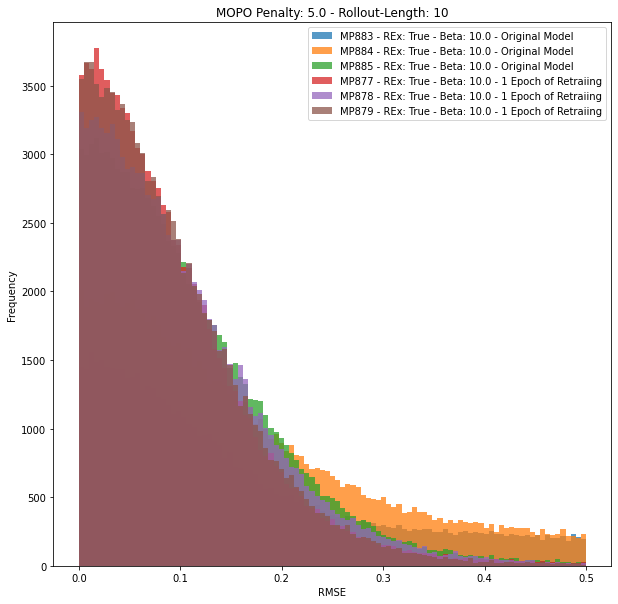

In [15]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
for i, (exp, rex, beta) in enumerate([
    ("MP883", True, "10.0 - Original Model"),
    ("MP884", True, "10.0 - Original Model"),
    ("MP885", True, "10.0 - Original Model"),
    ("MP877", True, "10.0 - 1 Epoch of Retraiing"),
    ("MP878", True, "10.0 - 1 Epoch of Retraiing"),
    ("MP879", True, "10.0 - 1 Epoch of Retraiing"),
]):
    ax.hist(np.sqrt(training_results[exp].mse_results), bins=np.linspace(0,0.5,100), color=cols[i], alpha=0.75, label=f'{exp} - REx: {rex} - Beta: {beta}')
    # ax.axvline(np.nanmean(np.sqrt(training_results[exp].mse_results)), color=cols[i], ls='--')
    print(f'{exp}: {np.sqrt(training_results[exp].mse_results).mean()}, {np.sqrt(training_results[exp].mse_results).max()}')
ax.set_title('MOPO Penalty: 5.0 - Rollout-Length: 10')
ax.set_xlabel('RMSE')
ax.set_ylabel('Frequency')
ax.legend(loc='upper right')

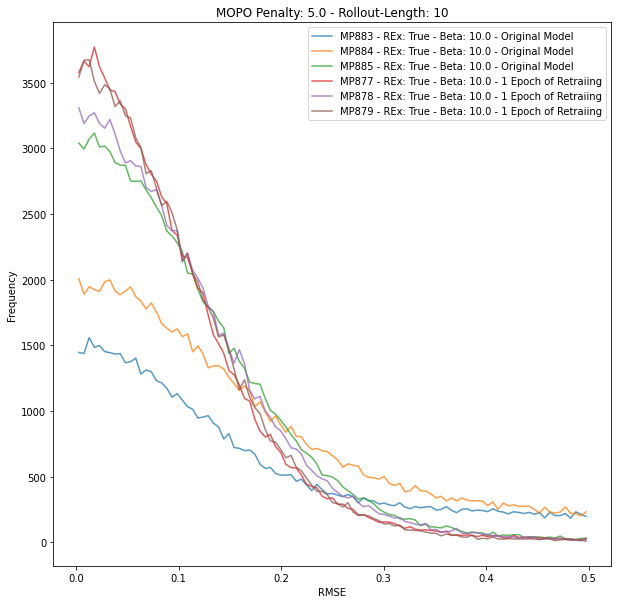

In [16]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
for i, (exp, rex, beta) in enumerate([
    ("MP883", True, "10.0 - Original Model"),
    ("MP884", True, "10.0 - Original Model"),
    ("MP885", True, "10.0 - Original Model"),
    ("MP877", True, "10.0 - 1 Epoch of Retraiing"),
    ("MP878", True, "10.0 - 1 Epoch of Retraiing"),
    ("MP879", True, "10.0 - 1 Epoch of Retraiing"),
]):
    bin_min, bin_max, bin_size = 0, 0.5, 100
    bins = np.linspace(bin_min, bin_max, bin_size)
    hist_arr, _ = np.histogram(np.sqrt(training_results[exp].mse_results), bins=bins)
    plt.plot((bins + bin_max/(2*(bin_size-1)))[:-1], hist_arr, color=cols[i], alpha=0.75, label=f'{exp} - REx: {rex} - Beta: {beta}')
    # ax.axvline(np.nanmean(np.sqrt(training_results[exp].mse_results)), color=cols[i], ls='--')
ax.set_title('MOPO Penalty: 5.0 - Rollout-Length: 10')
ax.set_xlabel('RMSE')
ax.set_ylabel('Frequency')
ax.legend(loc='upper right')

(-0.01, 2.5)

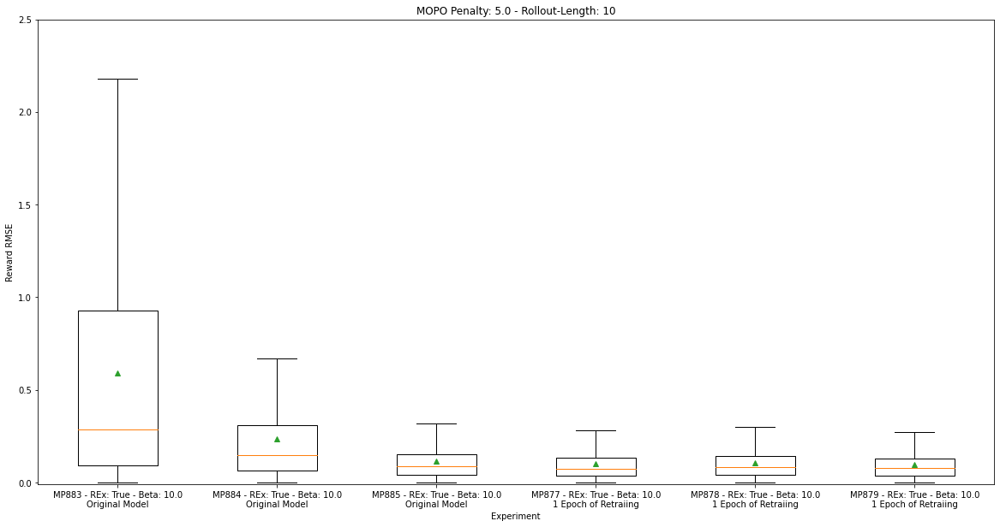

In [23]:
fig, ax = plt.subplots(1, 1, figsize=(20,10))

labels = []
rmse_arrs = []
for i, (exp, rex, beta) in enumerate([
    ("MP883", True, "10.0\nOriginal Model"),
    ("MP884", True, "10.0\nOriginal Model"),
    ("MP885", True, "10.0\nOriginal Model"),
    ("MP877", True, "10.0\n1 Epoch of Retraiing"),
    ("MP878", True, "10.0\n1 Epoch of Retraiing"),
    ("MP879", True, "10.0\n1 Epoch of Retraiing"),
]):
    labels.append(f'{exp} - REx: {rex} - Beta: {beta}')
    rmse_arrs.append(np.sqrt(training_results[exp].mse_results).flatten())

ax.boxplot(rmse_arrs, showmeans=True, showfliers=False, labels=labels)

ax.set_title('MOPO Penalty: 5.0 - Rollout-Length: 10')
ax.set_xlabel('Experiment')
ax.set_ylabel('Reward RMSE')
ax.set_ylim(-0.01,2.5)

(-0.01, 0.15)

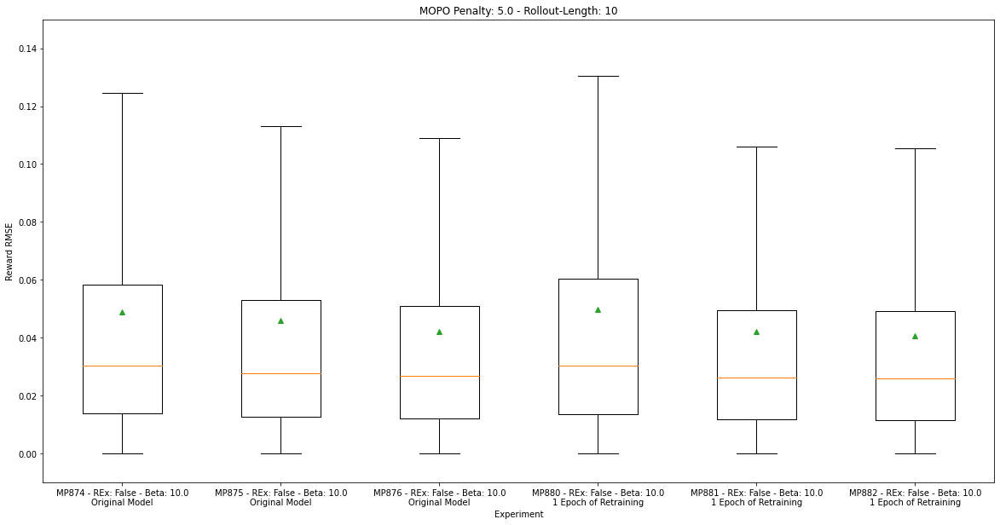

In [24]:
fig, ax = plt.subplots(1, 1, figsize=(20,10))

labels = []
rmse_arrs = []
for i, (exp, rex, beta) in enumerate([
    ("MP874", False, "10.0\nOriginal Model"),
    ("MP875", False, "10.0\nOriginal Model"),
    ("MP876", False, "10.0\nOriginal Model"),
    ("MP880", False, "10.0\n1 Epoch of Retraining"),
    ("MP881", False, "10.0\n1 Epoch of Retraining"),
    ("MP882", False, "10.0\n1 Epoch of Retraining"),
]):
    labels.append(f'{exp} - REx: {rex} - Beta: {beta}')
    rmse_arrs.append(np.sqrt(training_results[exp].mse_results).flatten())

ax.boxplot(rmse_arrs, showmeans=True, showfliers=False, labels=labels)

ax.set_title('MOPO Penalty: 5.0 - Rollout-Length: 10')
ax.set_xlabel('Experiment')
ax.set_ylabel('Reward RMSE')
ax.set_ylim(-0.01,0.15)

# Penalty/Reward RMSE Calibration

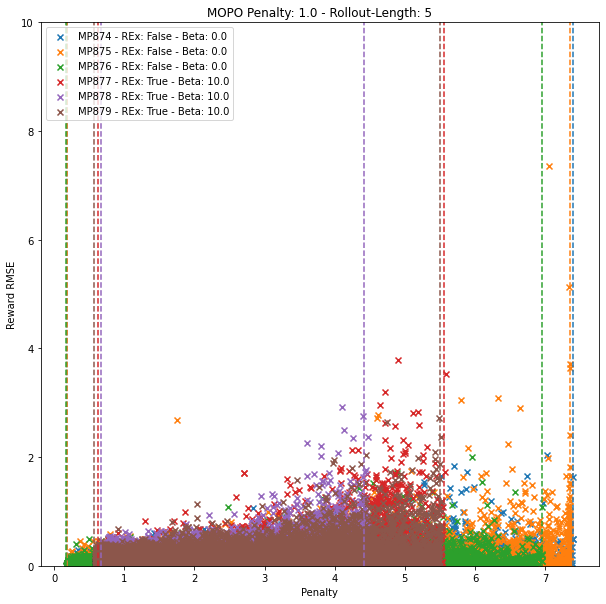

In [17]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
for i, (exp, rex, beta) in enumerate([
    ("MP874", False, 0.0),
    ("MP875", False, 0.0),
    ("MP876", False, 0.0),
    ("MP877", True, 10.0),
    ("MP878", True, 10.0),
    ("MP879", True, 10.0),
]):
    exp_details = get_experiment_details(exp)
    _, _, _, _, _, _, pens = split_halfcheetah_v2_trans_arr(training_results[exp].pool)
    ax.scatter(pens, np.sqrt(training_results[exp].mse_results), marker='x', color=cols[i], label=f'{exp} - REx: {rex} - Beta: {beta}')
    ax.axvline(exp_details.min_penalty, color=cols[i], ls='--')
    ax.axvline(exp_details.max_penalty, color=cols[i], ls='--')
ax.set_title('MOPO Penalty: 1.0 - Rollout-Length: 5')
ax.set_xlabel('Penalty')
ax.set_ylabel('Reward RMSE')
ax.set_ylim(0, 10)
ax.legend(loc='upper left')

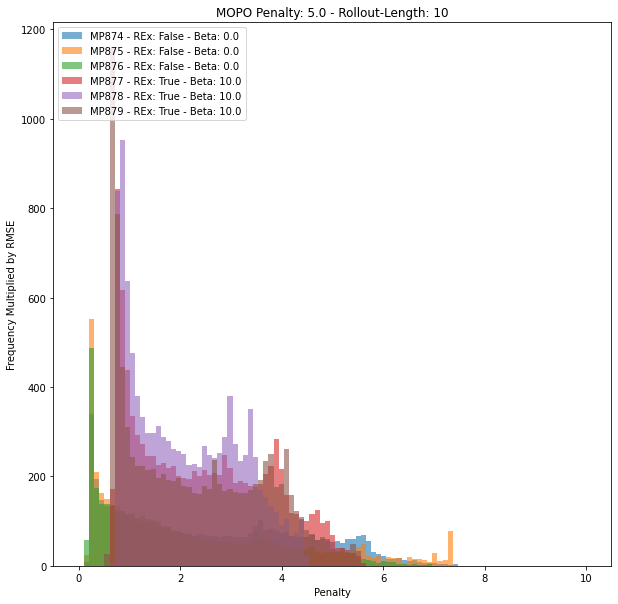

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
for i, (exp, rex, beta) in enumerate([
    ("MP874", False, 0.0),
    ("MP875", False, 0.0),
    ("MP876", False, 0.0),
    ("MP877", True, 10.0),
    ("MP878", True, 10.0),
    ("MP879", True, 10.0),
]):
    exp_details = get_experiment_details(exp)
    _, _, _, _, _, _, pens = split_halfcheetah_v2_trans_arr(training_results[exp].pool)
    rmse_vals = np.sqrt(training_results[exp].mse_results).flatten()
    rmse_lim = rmse_vals < 15
    ax.hist(pens.flatten()[rmse_lim], weights=rmse_vals[rmse_lim], bins=np.linspace(0,10,100), color=cols[i], alpha=0.6, label=f'{exp} - REx: {rex} - Beta: {beta}')
    # ax.axvline(exp_details.min_penalty, color=cols[i], ls='--')
    # ax.axvline(exp_details.max_penalty, color=cols[i], ls='--')
ax.set_title('MOPO Penalty: 5.0 - Rollout-Length: 10')
ax.set_xlabel('Penalty')
ax.set_ylabel('Frequency Multiplied by RMSE')
ax.legend(loc='upper left')

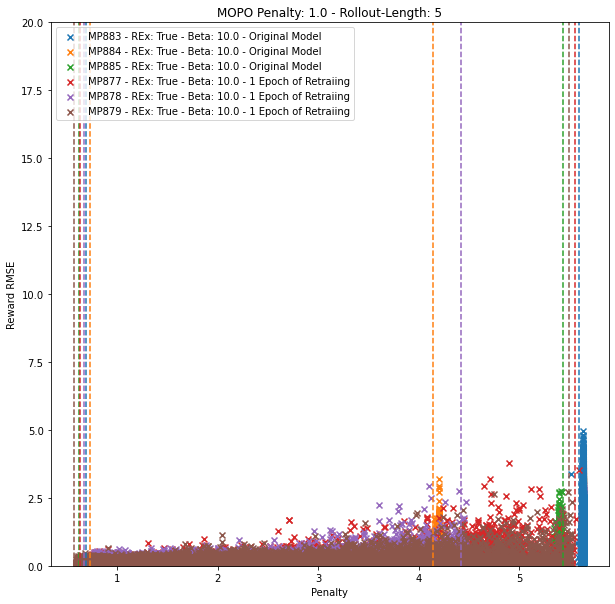

In [19]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
for i, (exp, rex, beta) in enumerate([
    ("MP883", True, "10.0 - Original Model"),
    ("MP884", True, "10.0 - Original Model"),
    ("MP885", True, "10.0 - Original Model"),
    ("MP877", True, "10.0 - 1 Epoch of Retraiing"),
    ("MP878", True, "10.0 - 1 Epoch of Retraiing"),
    ("MP879", True, "10.0 - 1 Epoch of Retraiing"),
]):
    exp_details = get_experiment_details(exp)
    _, _, _, _, _, _, pens = split_halfcheetah_v2_trans_arr(training_results[exp].pool)
    ax.scatter(pens, np.sqrt(training_results[exp].mse_results), marker='x', color=cols[i], label=f'{exp} - REx: {rex} - Beta: {beta}')
    ax.axvline(exp_details.min_penalty, color=cols[i], ls='--')
    ax.axvline(exp_details.max_penalty, color=cols[i], ls='--')
ax.set_title('MOPO Penalty: 1.0 - Rollout-Length: 5')
ax.set_xlabel('Penalty')
ax.set_ylabel('Reward RMSE')
ax.set_ylim(0, 20)
ax.legend(loc='upper left')

# Reward/Reward RMSE

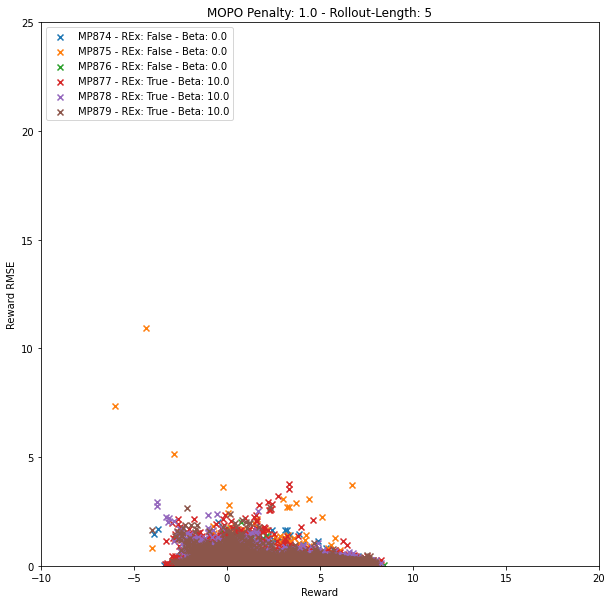

In [20]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
for i, (exp, rex, beta) in enumerate([
    ("MP874", False, 0.0),
    ("MP875", False, 0.0),
    ("MP876", False, 0.0),
    ("MP877", True, 10.0),
    ("MP878", True, 10.0),
    ("MP879", True, 10.0),
]):
    exp_details = get_experiment_details(exp)
    _, _, _, rew, _, _, pen = split_halfcheetah_v2_trans_arr(training_results[exp].pool)
    ax.scatter(rew+1*pen, np.sqrt(training_results[exp].mse_results), marker='x', color=cols[i], label=f'{exp} - REx: {rex} - Beta: {beta}')
    # ax.axvline(exp_details.max_penalty, color=cols[i], ls='--')
ax.set_title('MOPO Penalty: 1.0 - Rollout-Length: 5')
ax.set_xlabel('Reward')
ax.set_ylabel('Reward RMSE')
ax.set_xlim(-10, 20)
ax.set_ylim(0, 25)
ax.legend(loc='upper left')

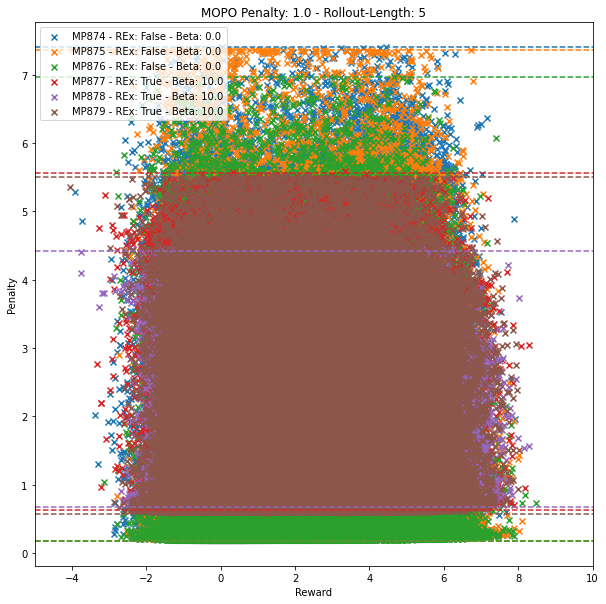

In [21]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
for i, (exp, rex, beta) in enumerate([
    ("MP874", False, 0.0),
    ("MP875", False, 0.0),
    ("MP876", False, 0.0),
    ("MP877", True, 10.0),
    ("MP878", True, 10.0),
    ("MP879", True, 10.0),
]):
    exp_details = get_experiment_details(exp)
    _, _, _, rew, _, _, pen = split_halfcheetah_v2_trans_arr(training_results[exp].pool)
    ax.scatter(rew+1*pen, pen, marker='x', color=cols[i], label=f'{exp} - REx: {rex} - Beta: {beta}')
    ax.axhline(exp_details.min_penalty, color=cols[i], ls='--')
    ax.axhline(exp_details.max_penalty, color=cols[i], ls='--')
ax.set_title('MOPO Penalty: 1.0 - Rollout-Length: 5')
ax.set_xlabel('Reward')
ax.set_ylabel('Penalty')
ax.set_xlim(-5, 10)
# ax.set_ylim(0, 40)
ax.legend(loc='upper left')

# State-Action Space Visitation

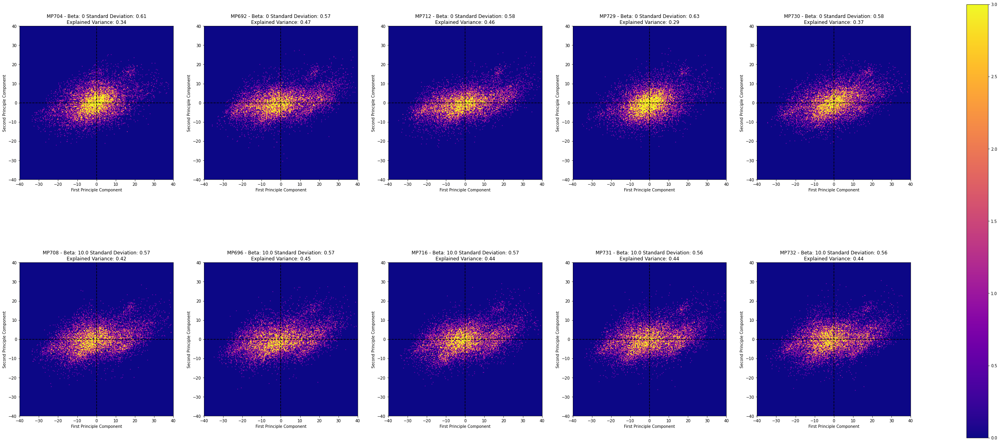

In [21]:
exp_list_label_set = [
    (("MP704", "MP692", "MP712", "MP729", "MP730"), '0'),
    (("MP708", "MP696", "MP716", "MP731", "MP732"), '10.0'),
]
model_pool_visitation_2dhist(training_results, exp_list_label_set, vmax=3)

/rds/user/ajc348/hpc-work/mopo/dogo/visualisation/model_pool_plotting.py:42: RuntimeWarning: invalid value encountered in true_divide
  hist_arr = np.where(counts_arr==0., 0., hist_arr/counts_arr)


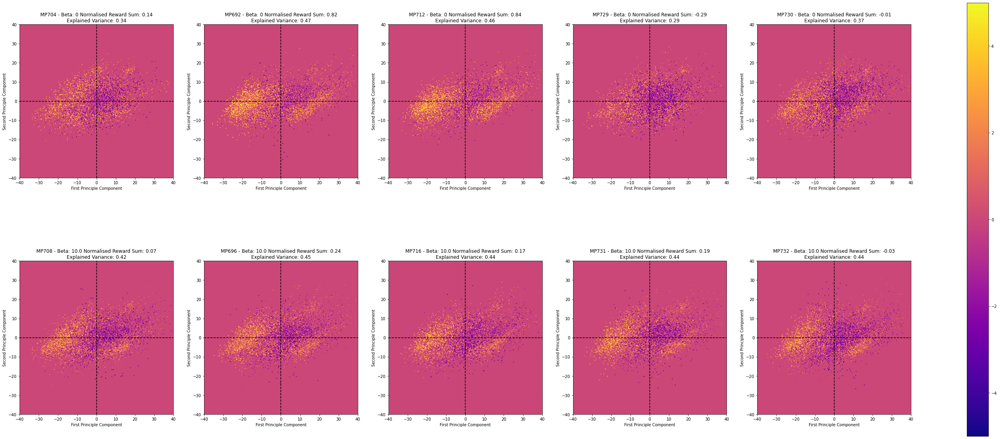

In [24]:
exp_list_label_set = [
    (("MP704", "MP692", "MP712", "MP729", "MP730"), '0'),
    (("MP708", "MP696", "MP716", "MP731", "MP732"), '10.0'),
]
model_pool_pen_rewards_2dhist(training_results, exp_list_label_set, vmin=-5, vmax=5)

MOPO Penalty: 1.0 - Rollout Length: 5 - 1 Epoch of Further Training

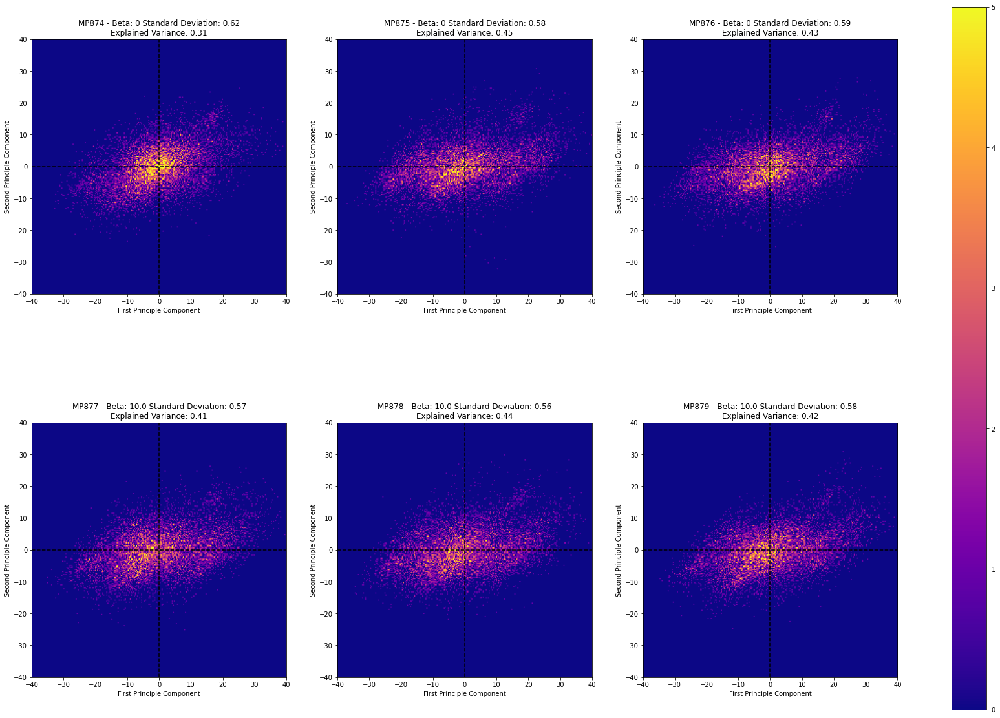

In [9]:
exp_list_label_set = [
    (("MP874", "MP875", "MP876"), '0'),
    (("MP877", "MP878", "MP879"), '10.0'),
]
model_pool_visitation_2dhist(training_results, exp_list_label_set, vmax=5)

/rds/user/ajc348/hpc-work/mopo/dogo/visualisation/model_pool_plotting.py:42: RuntimeWarning: invalid value encountered in true_divide
  hist_arr = np.where(counts_arr==0., 0., hist_arr/counts_arr)


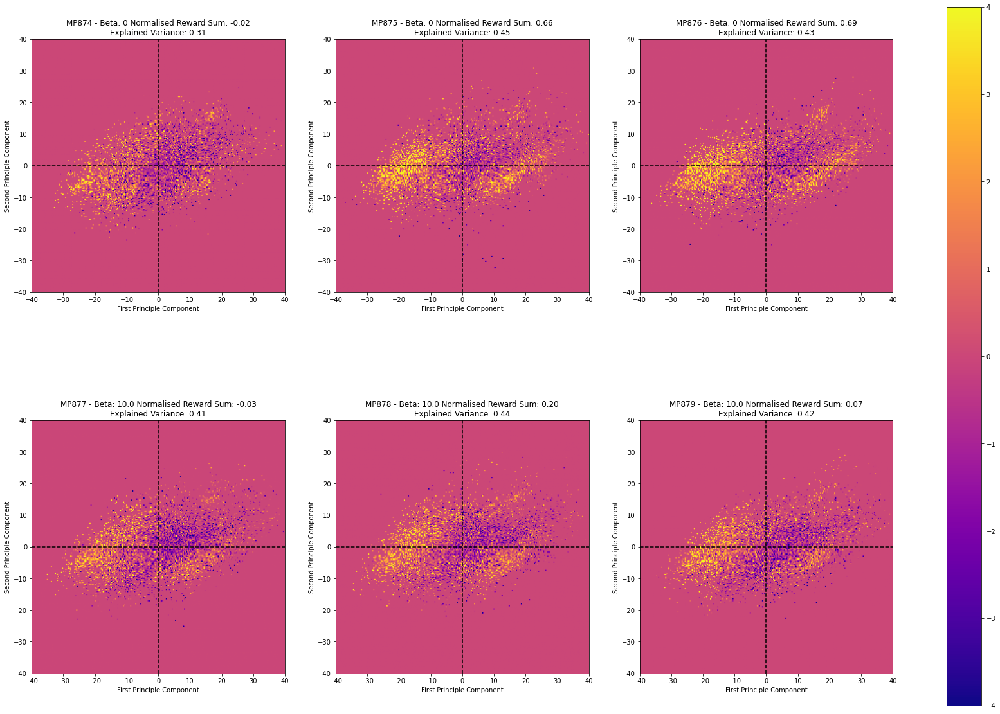

In [11]:
exp_list_label_set = [
    (("MP874", "MP875", "MP876"), '0'),
    (("MP877", "MP878", "MP879"), '10.0'),
]
model_pool_pen_rewards_2dhist(training_results, exp_list_label_set, vmin=-4, vmax=4)

/rds/user/ajc348/hpc-work/mopo/dogo/visualisation/model_pool_plotting.py:42: RuntimeWarning: invalid value encountered in true_divide
  hist_arr = np.where(counts_arr==0., 0., hist_arr/counts_arr)


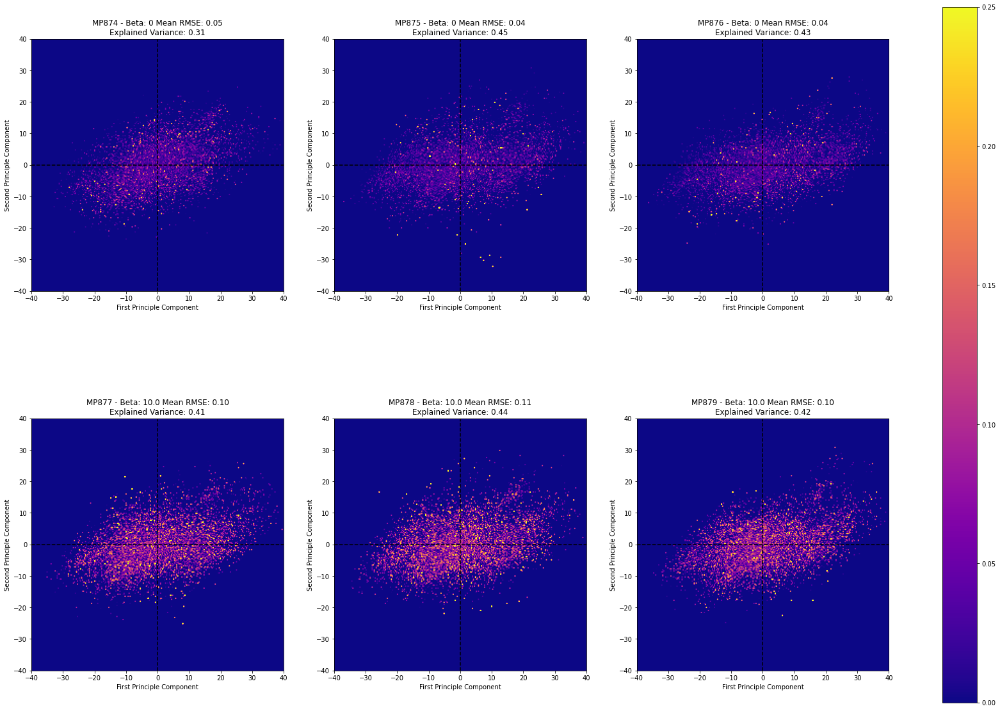

In [29]:
exp_list_label_set = [
    (("MP874", "MP875", "MP876"), '0'),
    (("MP877", "MP878", "MP879"), '10.0'),
]
model_pool_rmse_2dhist(training_results, exp_list_label_set, vmax=0.25)

MOPO Penalty: 1.0 - Rollout Length: 5 - No Epochs of Further Training

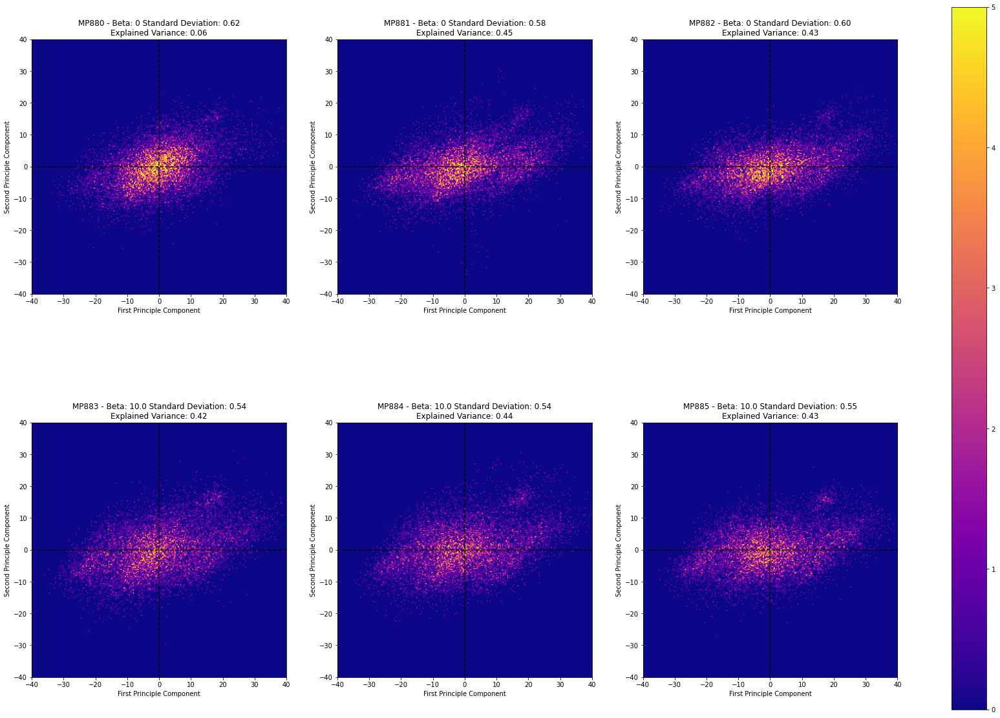

In [13]:
exp_list_label_set = [
    (("MP880", "MP881", "MP882"), '0'),
    (("MP883", "MP884", "MP885"), '10.0'),
]
model_pool_visitation_2dhist(training_results, exp_list_label_set, vmax=5)

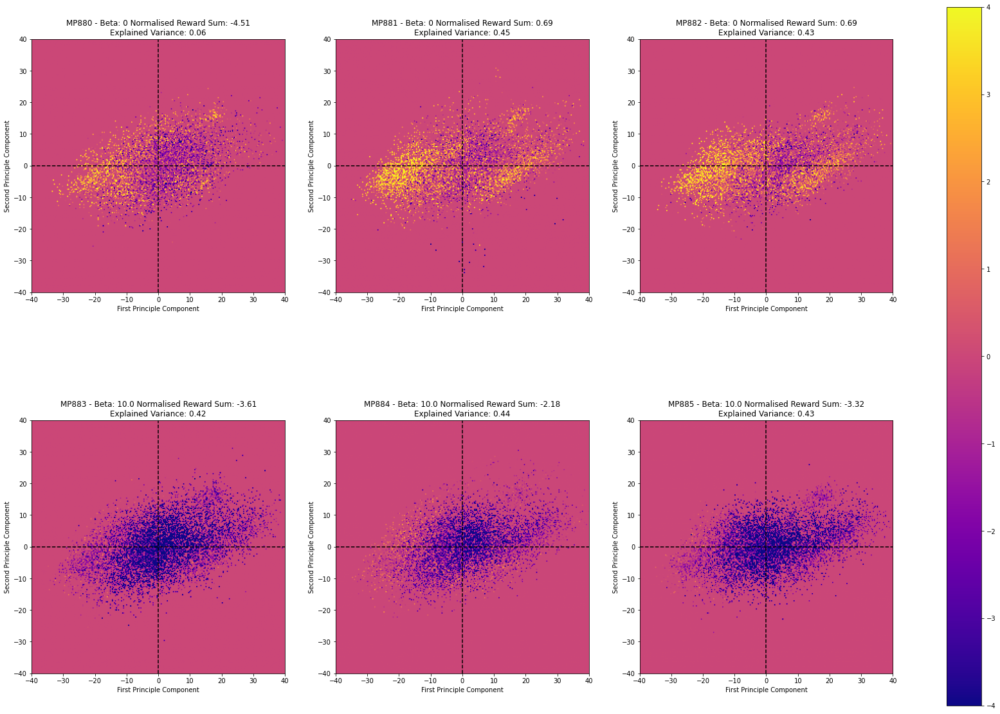

In [14]:
exp_list_label_set = [
    (("MP880", "MP881", "MP882"), '0'),
    (("MP883", "MP884", "MP885"), '10.0'),
]
model_pool_pen_rewards_2dhist(training_results, exp_list_label_set, vmin=-4, vmax=4)

/rds/user/ajc348/hpc-work/mopo/dogo/visualisation/model_pool_plotting.py:42: RuntimeWarning: invalid value encountered in true_divide
  hist_arr = np.where(counts_arr==0., 0., hist_arr/counts_arr)


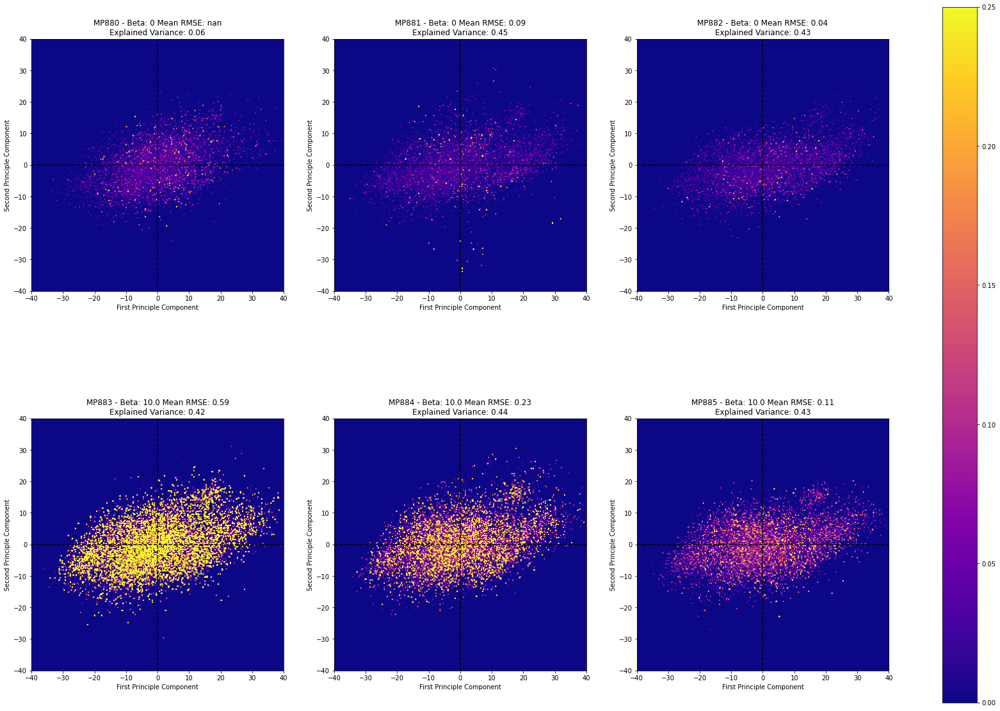

In [16]:
exp_list_label_set = [
    (("MP880", "MP881", "MP882"), '0'),
    (("MP883", "MP884", "MP885"), '10.0'),
]
model_pool_rmse_2dhist(training_results, exp_list_label_set, vmax=0.25)

MOPO Penalty: 1.0 - Rollout Length: 5 - Comparing REx runs with and without additional epoch of training

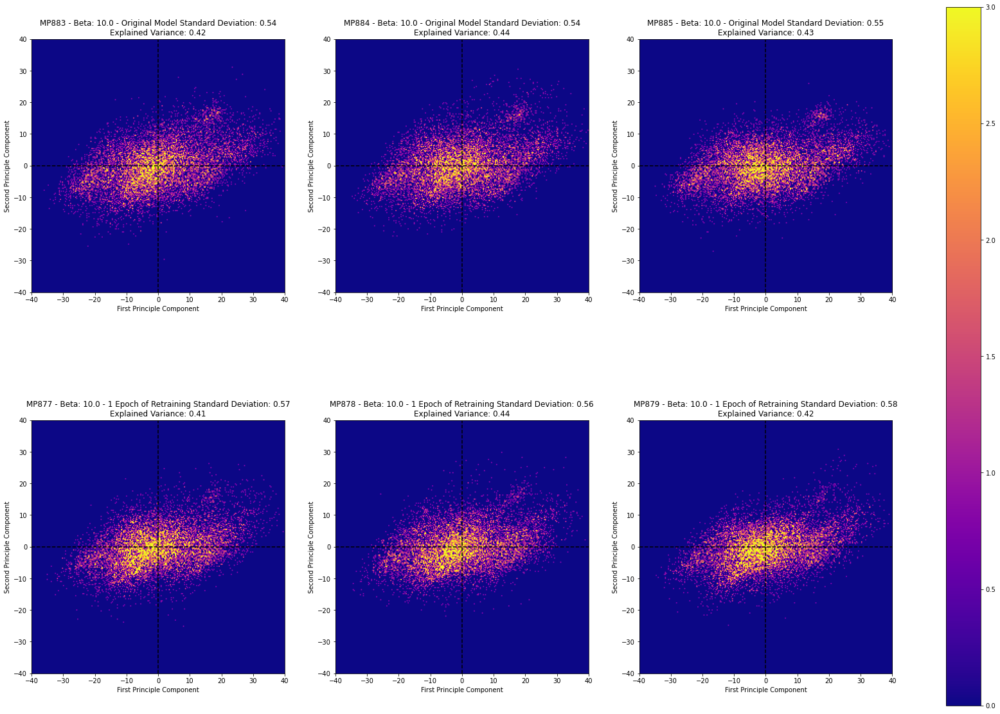

In [28]:
exp_list_label_set = [
    (("MP883", "MP884", "MP885"), '10.0 - Original Model'),
    (("MP877", "MP878", "MP879"), '10.0 - 1 Epoch of Retraining'),
]
model_pool_visitation_2dhist(training_results, exp_list_label_set, vmax=3)

/rds/user/ajc348/hpc-work/mopo/dogo/visualisation/model_pool_plotting.py:42: RuntimeWarning: invalid value encountered in true_divide
  hist_arr = np.where(counts_arr==0., 0., hist_arr/counts_arr)


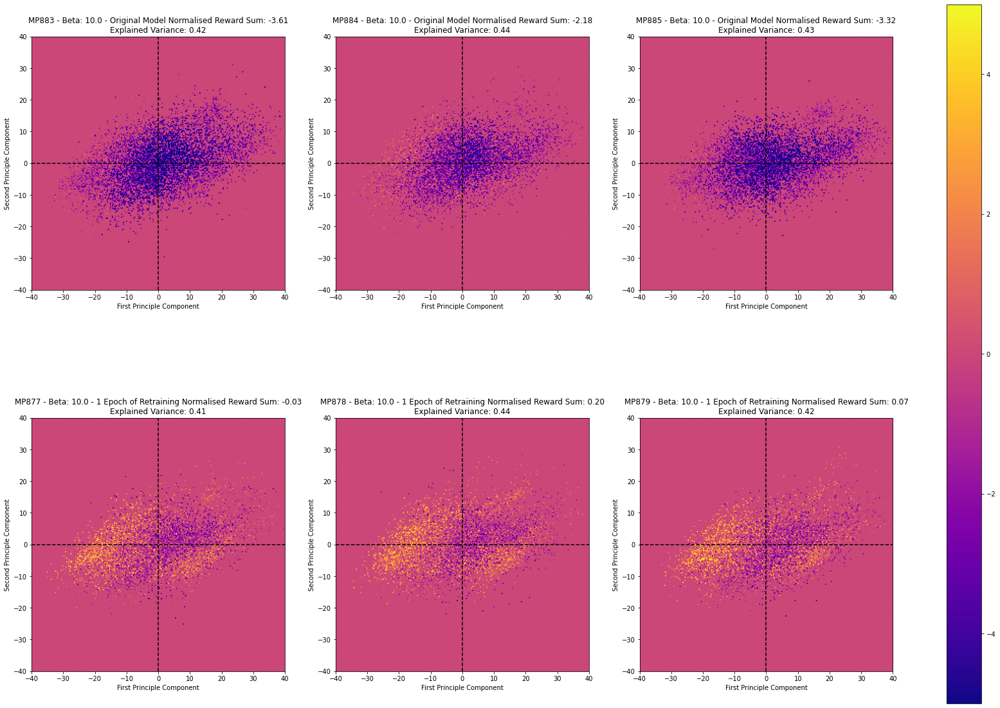

In [27]:
exp_list_label_set = [
    (("MP883", "MP884", "MP885"), '10.0 - Original Model'),
    (("MP877", "MP878", "MP879"), '10.0 - 1 Epoch of Retraining'),
]
model_pool_pen_rewards_2dhist(training_results, exp_list_label_set, vmin=-5, vmax=5)